In [1]:
%load_ext autoreload
%autoreload 2
import PIL
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cmtorch
from lidar import ClippedLidar2D, OnlineTrajectoryLidarDataset, TrajectoryLidarDataset, RandomPoseLidarDataset, Lidar2D
import torch

In [6]:
# traj = np.load("../planner/waypoint_path1.npy")
# traj = np.load("../planner/test_path.npy")
# traj = np.load("../planner/test_path2.npy")

In [9]:
# Full Lidar image for one short path
num_beams = 20
beam_samps = 25
beam_length = 0.2
spline_res = 80
samp_distribution_factor = 1.0
collision_samps = 50
fine_samps = 3
img_path = "../32_data/floor_img.png"

lidar = Lidar2D(img_path, num_beams, beam_length, beam_samps,
    samp_distribution_factor, collision_samps,
    fine_samps, border_width=30)

waypoints = np.load("../32_data/tight_paths/6.npy")
bldataset = TrajectoryLidarDataset(lidar, waypoints, spline_res)
#bldataset = RandomPoseLidarDataset(img_path, num_beams, beam_length,
#    beam_samps, samp_distribution_factor, collision_samps, fine_samps, num_scans, border_width=30)
ld_points = bldataset.scans[bldataset.scans[:,2] != 1.0]
hd_points = bldataset.scans[bldataset.scans[:,2] == 1.0]
print("hd point ratio regular: ", torch.sum(bldataset.scans[:,2] == 1.0) / bldataset.scans.shape[0])

lidar = ClippedLidar2D(img_path, num_beams, beam_length, 20, border_width=30)

bldataset = TrajectoryLidarDataset(lidar, waypoints, spline_res)
#bldataset = RandomPoseLidarDataset(img_path, num_beams, beam_length,
#    beam_samps, samp_distribution_factor, collision_samps, fine_samps, num_scans, border_width=30)
cli_ld_points = bldataset.scans[bldataset.scans[:,2] != 1.0]
cli_hd_points = bldataset.scans[bldataset.scans[:,2] == 1.0]
print("hd point ratio clipped: ", torch.sum(bldataset.scans[:,2] == 1.0) / bldataset.scans.shape[0])


hd point ratio regular:  tensor(0.0304)
hd point ratio clipped:  tensor(0.0475)


In [25]:
bldataset.scans[:1000, 2] == 1.0

tensor([False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
         True,  True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True,  True, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False,  True,  True, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, 

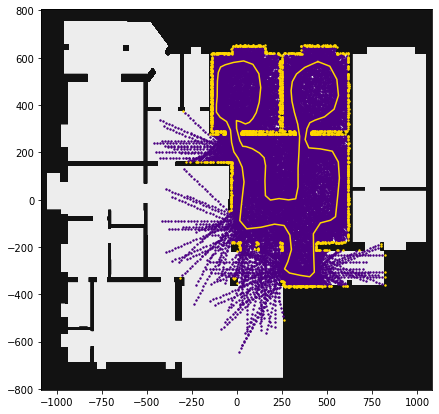

In [9]:
fig, ax = plt.subplots(figsize=(7, 7))
X, Y = np.meshgrid(bldataset.lidar.xs, bldataset.lidar.ys)
ax.contourf(X, Y, bldataset.lidar.img, cmap=cmtorch.binary)
ax.scatter(ld_points[:, 0], ld_points[:, 1], c='indigo', s=2)
ax.scatter(hd_points[:, 0], hd_points[:, 1], c='gold', s=2)
ax.plot(bldataset.scan_locs[:, 0], bldataset.scan_locs[:, 1], c='gold')


In [8]:
import random

class OnlineTensorDataset(torch.utils.data.Dataset):
    def __init__(self, batch_size):
        self.my_data = torch.arange(0, 15)
        self.tds = torch.utils.data.TensorDataset(self.my_data)
        self.len_tds = len(self.tds)
        self.window = 5
        self.curr_time = 4
        
        self.gen_next_index_list()
    
    def __getitem__(self, idx):
        if not self.curr_idx_list:
            self.gen_next_index_list()
        
        real_idx = self.curr_idx_list.pop()
        return self.tds[real_idx]
    
    def __len__(self):
        return self.window * len(self.tds)
    
    def gen_next_index_list(self):
        if self.curr_time >= self.len_tds:
            self.curr_time = 0
        self.curr_time += 1
        
        self.curr_idx_list = list(range(self.curr_time - self.window, self.curr_time))
        print(self.curr_idx_list)
        random.shuffle(self.curr_idx_list)
        return

In [9]:
ids = OnlineTensorDataset(batch_size=4)
test_dl = torch.utils.data.DataLoader(ids, batch_size=4)

for batch in test_dl:
    pass
    #ids.step()

ids.curr_idx_list

[0, 1, 2, 3, 4]
[1, 2, 3, 4, 5]
[2, 3, 4, 5, 6]
[3, 4, 5, 6, 7]
[4, 5, 6, 7, 8]
[5, 6, 7, 8, 9]
[6, 7, 8, 9, 10]
[7, 8, 9, 10, 11]
[8, 9, 10, 11, 12]
[9, 10, 11, 12, 13]
[10, 11, 12, 13, 14]
[-4, -3, -2, -1, 0]
[-3, -2, -1, 0, 1]
[-2, -1, 0, 1, 2]
[-1, 0, 1, 2, 3]


[]

In [24]:
num_beams = 20
beam_samps = 20
beam_length = 0.2
spline_res = 120
samp_distribution_factor = 1.0
collision_samps = 20
fine_samps = 3
num_scans_in_window = 50
#lidar = ClippedLidar2D(img_path, num_beams, beam_length, beam_samps,
#    border_width=30)
lidar = Lidar2D(img_path, num_beams, beam_length, beam_samps,
    samp_distribution_factor, collision_samps,
    fine_samps, border_width=30)


waypoints = np.load("../32_data/some_overlap/1.npy")
num_scans_in_window = 50
spline_res = 120
ods = OnlineTrajectoryLidarDataset(lidar, waypoints, spline_res, num_scans_in_window)


50


In [25]:
(fig, ax) = plt.subplots(figsize=(5, 5))
X, Y = np.meshgrid(lidar.xs, lidar.ys)
ax.contourf(X, Y, lidar.img, cmap=cmtorch.binary)

#    beam_samps, samp_distribution_factor, collision_samps, fine_samps, num_scans, border_width=30)
ld_points = ods.scans[ods.scans[:,2] != 1.0]
hd_points = ods.scans[ods.scans[:,2] == 1.0]

#ax.scatter(ld_points[:, 0], ld_points[:, 1], c='indigo', s=2)
#ax.scatter(hd_points[:, 0], hd_points[:, 1], c='gold', s=2)
#ax.plot(ods.scan_locs[:, 0], ods.scan_locs[:, 1], c='green')


Error in callback <function flush_figures at 0x7f08af3e4700> (for post_execute):


KeyboardInterrupt: 

In [26]:
ods_dl = torch.utils.data.DataLoader(ods, batch_size=8000)

100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
2050
2100
2150
2200
2250
2300
2350
2400
2450
2500
2550
2600
2650
2700
2750
2800
2850
2900
2950
3000
3050
3100
3150
3200
3250
3300
3350
3400
3450
3500
3550
3600
3650
3700
3750
3800
3850
3900
3950
4000
4050
4100
4150
4200
4250
4300
4350
4400
4450
4500
4550
4600
4650
4700
4750
4800
4850
4900
here
here
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
2050
2100
2150
2200
2250
2300
2350
2400
2450
2500
2550
2600
2650
2700
2750
2800
2850
2900
2950
3000
3050
3100
3150
3200
3250
3300
3350
3400
3450
3500
3550
3600
3650
3700
3750
3800
3850
3900
3950
4000
4050
4100
4150
4200
4250
4300
4350
4400
4450
4500
4550
4600
4650
4700
4750
4800
4850
4900
here


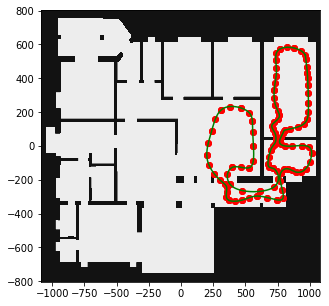

In [27]:
(fig, ax) = plt.subplots(figsize=(5, 5))
ax.contourf(X, Y, lidar.img, cmap=cmtorch.binary)
ax.plot(ods.scan_locs[:, 0], ods.scan_locs[:, 1], c='green')
for batch in ods_dl:
    #ax.scatter(batch[0][:, 0], batch[0][:, 1], s=2)
    ax.scatter(ods.curr_pos[0], ods.curr_pos[1], c="red")

for batch in ods_dl:
    pass

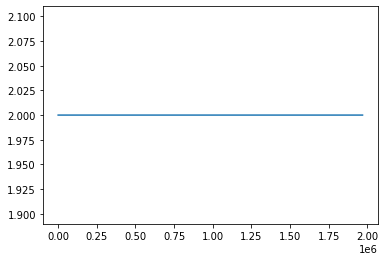

In [28]:
plt.plot(ods.batch_tracker)

In [23]:
ods.scan_size * ods.curr_scan_idx

1200000